In [2]:
import numpy as np
from skimage.filters import threshold_multiotsu
from skimage.segmentation import mark_boundaries
from skimage.io import imread
from skimage.transform import resize
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split

In [3]:
from google.colab import drive

In [4]:
drive.mount('/content/drive')
filenames ='/content/drive/My Drive/dataset/semantic'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Define the path to the main folder
main_folder = "/content/drive/My Drive/dataset/semantic"

# Initialize empty lists to store image and mask paths
image_paths = []
mask_paths = []

# Iterate over the subfolders and files to collect the paths
for tile in range(1, 9):
    tile_folder = os.path.join(main_folder, f"Tile {tile}")
    image_folder = os.path.join(tile_folder, "images")
    mask_folder = os.path.join(tile_folder, "masks")

    # Collect the paths of images and masks
    image_paths.extend([os.path.join(image_folder, file) for file in os.listdir(image_folder)])
    mask_paths.extend([os.path.join(mask_folder, file) for file in os.listdir(mask_folder)])


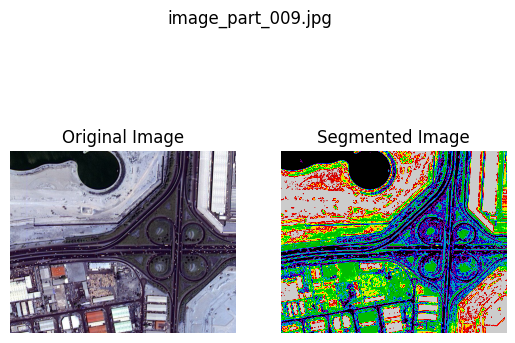

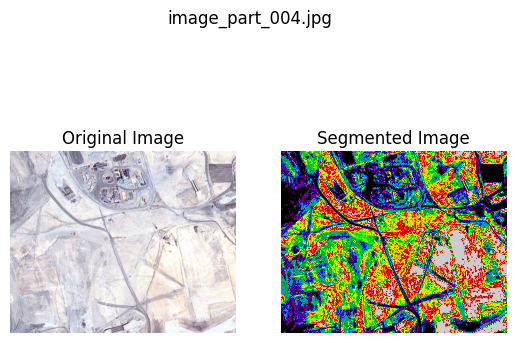

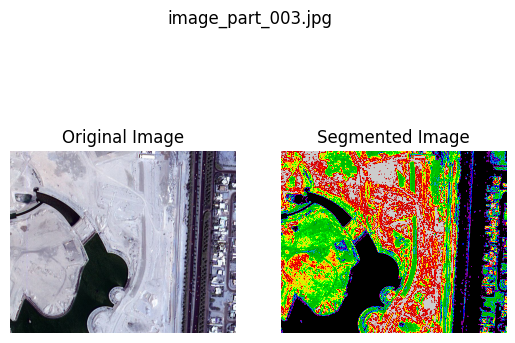

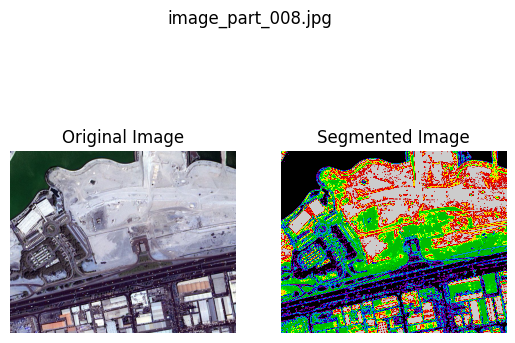

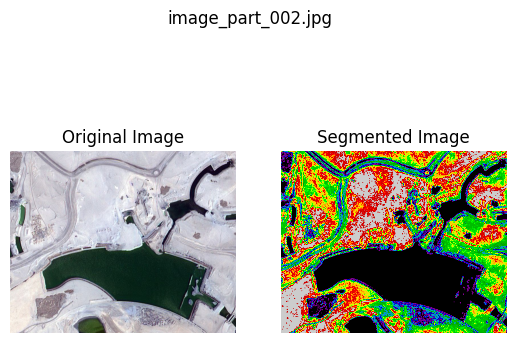

...

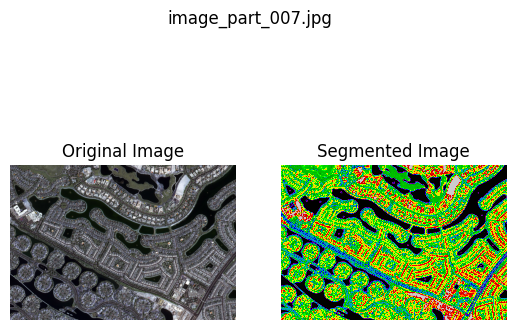

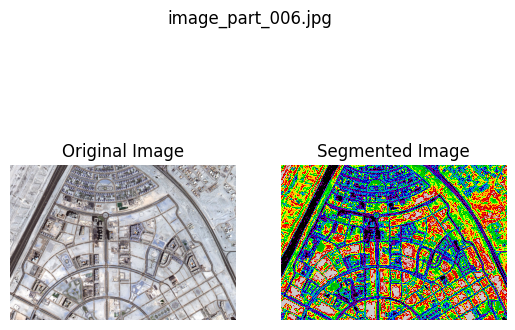

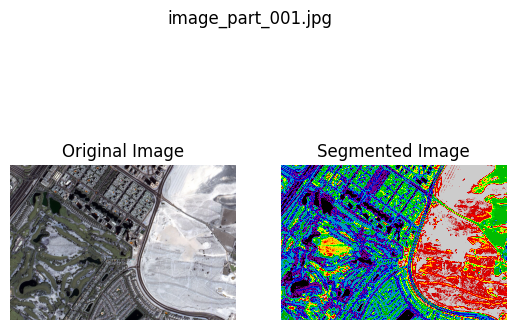

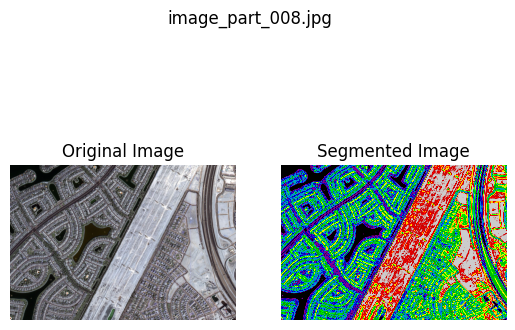

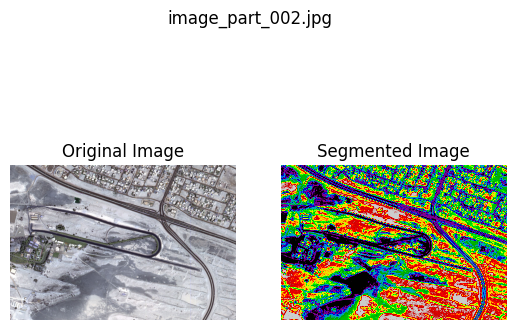

In [6]:
# Define the number of thresholds for multi-otsu segmentation
num_thresholds = 3

# Initialize empty lists to store segmented images
segmented_images = []

# Iterate over the image paths
for image_path in image_paths:
    # Read the image
    image = imread(image_path)

    # Convert image to grayscale if needed
    if image.ndim > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Resize the image if needed
    # image = resize(image, (desired_height, desired_width))

    # Preprocessing: Apply histogram equalization to enhance contrast
    image = cv2.equalizeHist(image)

    # Apply multi-threshold Otsu segmentation
    thresholds = threshold_multiotsu(image, classes=num_thresholds)
    segmented = np.digitize(image, thresholds)

    # Append the segmented image to the list
    segmented_images.append(segmented)

# Visualize the segmented images
for i, segmented_image in enumerate(segmented_images):
    image_path = image_paths[i]
    image_name = os.path.basename(image_path)

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.imshow(imread(image_path), cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Plot the segmented image
    plt.subplot(1, 2, 2)
    plt.imshow(segmented_image, cmap='nipy_spectral')
    plt.title('Segmented Image')
    plt.axis('off')

    plt.suptitle(image_name)
    plt.show()


In [7]:
import numpy as np
from skimage.filters import threshold_multiotsu
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import os

In [8]:
num_thresholds = 3

# Initialize empty lists to store segmented images and masks
segmented_images = []
mask_images = []

# Iterate over the image paths
for image_path in image_paths:
    # Read the image
    image = imread(image_path)

    # Convert image to grayscale
    image_gray = rgb2gray(image)

    # Convert image to 8-bit unsigned integer grayscale
    image_gray = (image_gray * 255).astype(np.uint8)

    # Apply histogram equalization to enhance contrast
    image_gray = cv2.equalizeHist(image_gray)

    # Apply multi-threshold Otsu segmentation
    thresholds = threshold_multiotsu(image_gray, classes=num_thresholds)
    segmented = np.digitize(image_gray, thresholds)

    # Append the segmented image to the list
    segmented_images.append(segmented)

    # Get the corresponding mask file path
    mask_filename = os.path.splitext(os.path.basename(image_path))[0] + ".jpg"  # Get the filename with ".jpg" extension
    mask_path = os.path.join(os.path.dirname(image_path), mask_filename)  # Assuming mask files have the same directory as the images

    # Read the mask
    mask = imread(mask_path)

    # Append the mask image to the list
    mask_images.append(mask)

# Calculate the IoU for each segmented image
iou_values = []
for i, segmented_image in enumerate(segmented_images):
    mask = mask_images[i]

    # Convert mask to grayscale
    mask_gray = rgb2gray(mask)

    # Calculate intersection and union
    intersection = np.logical_and(mask_gray, segmented_image)
    union = np.logical_or(mask_gray, segmented_image)

    # Calculate IoU (Jaccard Index)
    iou = np.sum(intersection) / np.sum(union)
    iou_values.append(iou)

# Calculate the mean IoU
mean_iou = np.mean(iou_values)

# Print the mean IoU
print("Mean IoU:", mean_iou)

Mean IoU: 0.6806121144905847


In [9]:
import numpy as np
from skimage.filters import threshold_multiotsu
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import os

In [10]:
# Define the number of thresholds for multi-otsu segmentation
num_thresholds = 3

# Initialize empty lists to store segmented images and masks
segmented_images = []
mask_images = []

# Iterate over the image paths
for image_path in image_paths:
    # Read the image
    image = imread(image_path)

    # Convert image to grayscale if needed
    if image.ndim > 2:
        image_gray = rgb2gray(image)
    else:
        image_gray = image

    # Convert image to 8-bit unsigned integer grayscale
    image_gray = (image_gray * 255).astype(np.uint8)

    # Apply histogram equalization to enhance contrast
    image_gray = cv2.equalizeHist(image_gray)

    # Apply multi-threshold Otsu segmentation
    thresholds = threshold_multiotsu(image_gray, classes=num_thresholds)
    segmented = np.digitize(image_gray, thresholds)

    # Append the segmented image to the list
    segmented_images.append(segmented)

    # Get the corresponding mask file path
    mask_filename = os.path.splitext(os.path.basename(image_path))[0] + ".jpg"  # Get the filename with ".jpg" extension
    mask_path = os.path.join(os.path.dirname(image_path), mask_filename)  # Assuming mask files have the same directory as the images

    # Read the mask
    mask = imread(mask_path)

    # Convert mask to grayscale if needed
    if mask.ndim > 2:
        mask_gray = rgb2gray(mask)
    else:
        mask_gray = mask

    # Append the mask image to the list
    mask_images.append(mask_gray)

# Calculate the overall accuracy for each segmented image
accuracy_values = []
for i, segmented_image in enumerate(segmented_images):
    mask = mask_images[i]

    # Calculate the number of correctly classified pixels
    correct_pixels = np.sum(mask == segmented_image)

    # Calculate the total number of pixels
    total_pixels = mask.size

    # Calculate the accuracy
    accuracy = correct_pixels / total_pixels

    # Append the accuracy to the list
    accuracy_values.append(accuracy)

# Calculate the mean accuracy
mean_accuracy = np.mean(accuracy_values)

# Print the mean accuracy
print("Mean Accuracy:", mean_accuracy)

Mean Accuracy: 0.0009636279648351357


In [11]:
from skimage.metrics import variation_of_information

In [12]:
vi_values = []

# Iterate over the segmented images and mask images
for segmented_image, mask in zip(segmented_images, mask_images):
    # Calculate VI
    vi = variation_of_information(segmented_image.flatten().astype(int), mask.flatten().astype(int))
    vi_values.append(vi)

# Calculate the mean VI
mean_vi = np.mean(vi_values)

# Print the mean VI
print("Mean VI:", mean_vi)

Mean VI: 0.7969130819541151


In [13]:
from skimage.measure import regionprops
from skimage import measure

In [14]:
compactness_values = []

# Iterate over the segmented images
for segmented_image in segmented_images:
    # Get the labeled regions from the segmented image
    labeled_image = measure.label(segmented_image)

    # Calculate region properties
    region_props = regionprops(labeled_image)

    # Calculate compactness for each region
    for region in region_props:
        # Calculate perimeter and area
        perimeter = region.perimeter
        area = region.area

        # Calculate compactness
        compactness = (perimeter ** 2) / area

        # Append the compactness value to the list
        compactness_values.append(compactness)

# Calculate the mean compactness
mean_compactness = np.mean(compactness_values)

# Print the mean compactness
print("Mean Compactness:", mean_compactness)

Mean Compactness: 10.693965691275848


In [15]:
from skimage.measure import find_contours
from skimage.filters import sobel
from skimage.segmentation import mark_boundaries

In [17]:
objectness_values = []

# Iterate over the segmented images and corresponding mask images
for segmented_image, mask in zip(segmented_images, mask_images):
    # Find the contours of the segmented image
    contours = find_contours(segmented_image, level=0.5)

    # Calculate the saliency map using the Sobel filter
    saliency_map = sobel(mask)

    # Calculate the average saliency of contour pixels inside and outside the object
    saliency_inside = 0.0
    saliency_outside = 0.0
    count_inside = 0
    count_outside = 0

    for contour in contours:
        for point in contour:
            row, col = point
            if mask[int(row), int(col)] != 0:
                saliency_inside += saliency_map[int(row), int(col)]
                count_inside += 1
            else:
                saliency_outside += saliency_map[int(row), int(col)]
                count_outside += 1

    # Calculate objectness as the ratio between average saliency inside and average saliency outside
    if count_outside != 0:
        objectness = saliency_inside / count_inside / (saliency_outside / count_outside)
        objectness_values.append(objectness)

# Calculate the mean objectness, excluding inf values
mean_objectness = np.mean([value for value in objectness_values if not np.isinf(value)])

# Print the mean objectness
print("Mean Objectness:", mean_objectness)

Mean Objectness: 0.6369110518579215
